# Bayesian LMER of the Spacing Effect
## Computational Methods in Psychology and Neuroscience
### Psychology 4215/7215 --- Fall 2023
By: Per B. Sederberg, PhD



# Lesson Objectives

Upon completion of this lesson, students should have learned:

1. Quick ANOVA example on spaced data
2. Fit and visualize a Bayesian mixed-effects regression to our data
3. Leave with d' example for class/home work


# New libraries to install

You're going to need new Bayesian modeling and plotting libraries, so run these lines at your Anaconda Prompt/Terminal:

```bash
conda install -c conda-forge arviz
conda install -c conda-forge bambi
pip install scikit-misc
```
If the conda installations are taking too long, you can try to use `pip` to install all three.

In [1]:
%matplotlib inline

In [2]:
# import some useful libraries
import numpy as np                # numerical analysis linear algebra
import pandas as pd               # efficient tables
import matplotlib.pyplot as plt   # plotting
import plotnine as pn
import scipy.stats.distributions as dists     # probability distributions
from scipy import stats
from glob import glob
import os
import arviz as az
import bambi as bmb
import statsmodels.formula.api as smf
import statsmodels.api as sm

from smile.log import log2dl

from ci_within import ci_within

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


## Custom SLOG loading function

In [3]:
# custom function to load slogs
def load_all_subj_logs(data_dir, log_file):
    # load in a list of all the subj
    subjs = [os.path.splitext(os.path.split(filepath)[1])[0].split('_')[-1]
             for filepath in glob(os.path.join(data_dir, log_file + '*.slog'))]
    subjs.sort()

    # loop over subj and their data
    all_dat = []
    for subj in subjs:
        # set the file
        log_path = os.path.join(data_dir, log_file+'_'+subj+'.slog')
        #print(log_path)

        # load the data
        try:
            all_dat.extend(log2dl(log_path, subj=subj))
        except:
            pass

    df = pd.DataFrame(all_dat)
    
    return df

## Load in all the data

In [4]:
# load the data from each task
data_dir = 'spaced_dat'
df_s = load_all_subj_logs(data_dir, 'log_spaced_study')
df_t = load_all_subj_logs(data_dir, 'log_spaced_test')
df_t.head()

,resp_map_target,resp_map_lure,block_num,trial_num,stim_on_time,stim_on_error,resp,resp_time_time,resp_time_error,rt,...,log_time,filename,in_out,loc,cond,pres_num,type,lag,subj,log_num
0,J,F,0,0,411054.782341,0.0,J,411055.916975,0.000169,1.134633,...,411056.757311,in0240.jpg,indoor,indoor,massed,1,target,1,s000,0
1,J,F,0,1,411056.782269,0.0,J,411057.704637,0.009238,0.922368,...,411058.477271,in0145.jpg,indoor,indoor,spaced,1,target,6,s000,0
2,J,F,0,2,411058.515414,0.0,J,411059.326911,0.000171,0.811497,...,411060.114274,in0383.jpg,indoor,indoor,once,1,target,0,s000,0
3,J,F,0,3,411060.149393,0.0,J,411060.822019,0.009527,0.672626,...,411062.071926,in0227.jpg,indoor,indoor,spaced,1,target,8,s000,0
4,J,F,0,4,411062.115631,0.0,J,411062.938160,0.009523,0.822528,...,411064.165725,in0091.jpg,indoor,indoor,massed,1,target,1,s000,0


## Some data clean-up

In [5]:
# add in log_rt columns
df_t['log_rt'] = np.log(df_t['rt'])

# must make correct an int
df_t['correct'] = df_t['correct'].astype(int)

# add in a column for whether they made an 'old' response
df_t['old_resp'] = (df_t['resp_map_target'] == df_t['resp']).astype(int)

# make the cond of lures be lures
df_t.loc[df_t.type=='lure', 'cond'] = 'lure'

# Massed vs. Spaced Word Recognition

Primary question: Is there an effect of massed vs. spaced study on recognition accuracy?

Secondary question: Are indoor or outdoor scenes remembered better?

In [6]:
df_t.columns

Index(['resp_map_target', 'resp_map_lure', 'block_num', 'trial_num',
       'stim_on_time', 'stim_on_error', 'resp', 'resp_time_time',
       'resp_time_error', 'rt', 'correct', 'log_time', 'filename', 'in_out',
       'loc', 'cond', 'pres_num', 'type', 'lag', 'subj', 'log_num', 'log_rt',
       'old_resp'],
      dtype='object')

In [7]:
# get the error corrected by condition and whether they answered correctly
res = ci_within(df_t, #.loc[df_t.type=='target'],  
                indexvar='subj',       # column that identifies a subject
                withinvars=['cond', 'loc'],     # list of columns for grouping within subject
                measvar='correct')        # dependent variable averaging over
res = res.reset_index()

res

,cond,loc,mean,std,sem,ci,len
0,lure,indoor,0.916444,0.287118,0.008560,0.016796,1125
1,lure,outdoor,0.940444,0.252740,0.007535,0.014785,1125
2,massed,indoor,0.898667,0.303602,0.015678,0.030828,375
3,massed,outdoor,0.848000,0.360187,0.018600,0.036574,375
4,once,indoor,0.864000,0.358910,0.018534,0.036444,375
5,once,outdoor,0.794667,0.411077,0.021228,0.041741,375
6,spaced,indoor,0.928000,0.258363,0.013342,0.026234,375
7,spaced,outdoor,0.912000,0.293387,0.015150,0.029791,375


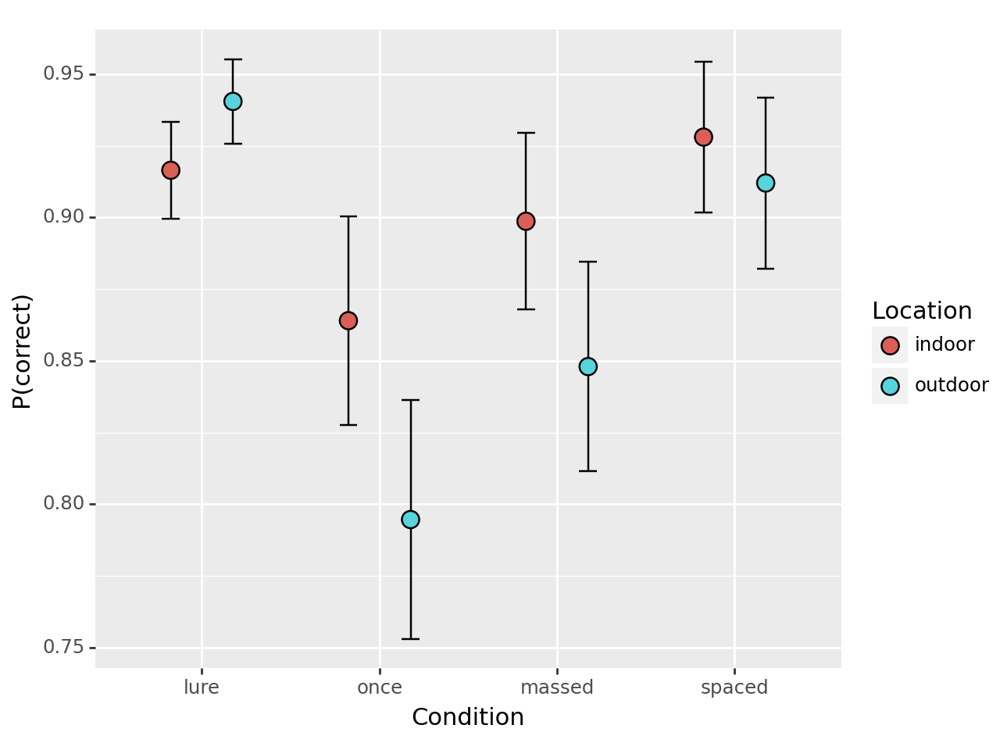

<Figure Size: (640 x 480)>

In [8]:
p = (pn.ggplot(res, pn.aes('cond', 'mean', fill='loc'))
     + pn.geom_errorbar(pn.aes(ymin='mean-ci', ymax='mean+ci', width=0.2), 
                        position=pn.position_dodge(.7))
     + pn.geom_point(position=pn.position_dodge(.7), size=4)
     #+ pn.facet_wrap('~type')
     + pn.scale_x_discrete(limits=['lure', 'once', 'massed', 'spaced'])
     + pn.labs(x="Condition", y = "P(correct)", fill='Location')
    )
p

## Testing for significance

Using a standard linear model, we must average performance within subject


In [9]:
# use the agg method to get the means
perf = df_t.groupby(['subj', 'cond', 'loc'])['correct'].mean()
perf = perf.reset_index()
perf

,subj,cond,loc,correct
0,s000,lure,indoor,0.866667
1,s000,lure,outdoor,0.955556
2,s000,massed,indoor,0.933333
3,s000,massed,outdoor,1.000000
4,s000,once,indoor,0.933333
...,...,...,...,...
195,s024,massed,outdoor,0.933333
196,s024,once,indoor,0.866667
197,s024,once,outdoor,0.866667
198,s024,spaced,indoor,0.933333


In [10]:
# build a linear regression of the full model
m0 = smf.ols("correct ~ cond * loc", perf).fit()
m0.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                correct   R-squared:                       0.113
Model:                            OLS   Adj. R-squared:                  0.080
Method:                 Least Squares   F-statistic:                     3.488
Date:                Mon, 13 Nov 2023   Prob (F-statistic):            0.00152
Time:                        00:59:32   Log-Likelihood:                 126.96
No. Observations:                 200   AIC:                            -237.9
Df Residuals:                     192   BIC:                            -211.5
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         0.9164      0.026     35.005      0.000       0.865       0.968
cond[T.massed]                   -0.0178      0.037     -0.480      0.632      -0.091       0.055
cond[T.once]                     -0.0524      0.037     -1.416      0.158      -0.125       0.021
cond[T.spaced]                    0.0116      0.037      0.312      0.755      -0.061       0.085
loc[T.outdoor]                    0.0240      0.037      0.648      0.518      -0.049       0.097
cond[T.massed]:loc[T.outdoor]    -0.0747      0.052     -1.426      0.155      -0.178       0.029
cond[T.once]:loc[T.outdoor]      -0.0933      0.052     -1.783      0.076      -0.197       0.010
cond[T.spaced]:loc[T.outdoor]    -0.0400      0.052     -0.764      0.446      -0.143       0.063
==============================================================================
Omnibus:                       74.986   Durbin-Watson:                   1.157
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              185.162
Skew:                          -1.697   Prob(JB):                     6.20e-41
Kurtosis:                       6.272   Cond. No.                         12.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Running an ANOVA on the linear model results

- Such a complicated linear model is really hard to unpack
- The most common approach to modeling the data would be a repeated measures ANOVA
- Luckily, a linear regression is really just an ANOVA if you make the right comparisons
- Statsmodels provides a way to handle that for you.

In [11]:
# Run a type-II repeated measures ANOVA based on the linear model results
sm.stats.anova_lm(m0, typ=2)

,sum_sq,df,F,PR(>F)
cond,0.315822,3.0,6.143663,0.000521
loc,0.039200,1.0,2.287663,0.132050
cond:loc,0.063378,3.0,1.232883,0.299011
Residual,3.289995,192.0,NaN,NaN


# Bayesian Mixed-effects Regression

- We can use hierarchical Bayesian approaches to build regression models that predict trial-level data taking   into account both subject-level and item-level variability.

- The *BAyesian Model-Building Interface ([Bambi](https://bambinos.github.io/bambi/index.html))* package helps us build and perform parameter inference on mixed-effects models.


## Build and fit the model

In [12]:
# First initialize the model with the data frame we're using
model = bmb.Model('correct ~ cond * loc + (cond*loc|subj) + (1|filename)', 
                  df_t.loc[df_t['type']=='target'],
                  family='bernoulli')


In [13]:

# next build the regression with both fixed and random effects
results = model.fit(idata_kwargs=dict(log_likelihood=True))

Modeling the probability that correct==1
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [Intercept, cond, loc, cond:loc, 1|subj_sigma, 1|subj_offset, cond|subj_sigma, cond|subj_offset, loc|subj_sigma, loc|subj_offset, cond:loc|subj_sigma, cond:loc|subj_offset, 1|filename_sigma, 1|filename_offset]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 335 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [14]:
model

       Formula: correct ~ cond * loc + (cond*loc|subj) + (1|filename)
        Family: bernoulli
          Link: p = logit
  Observations: 2250
        Priors: 
    target = p
        Common-level effects
            Intercept ~ Normal(mu: 0.0, sigma: 4.6098)
            cond ~ Normal(mu: [0. 0.], sigma: [5.3033 5.3033])
            loc ~ Normal(mu: 0.0, sigma: 5.0)
            cond:loc ~ Normal(mu: [0. 0.], sigma: [6.7082 6.7082])
        
        Group-level effects
            1|subj ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 4.6098))
            cond|subj ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: [5.3033 5.3033]))
            loc|subj ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 5.0))
            cond:loc|subj ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: [6.7082 6.7082]))
            1|filename ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 4.6098))
------
* To see a plot of the priors call the .plot_priors() method.
* To see a summary or plot of the posterior pass the object returned by .

Sampling: [1|filename_sigma, 1|subj_sigma, Intercept, cond, cond:loc, cond:loc|subj_sigma, cond|subj_sigma, loc, loc|subj_sigma]


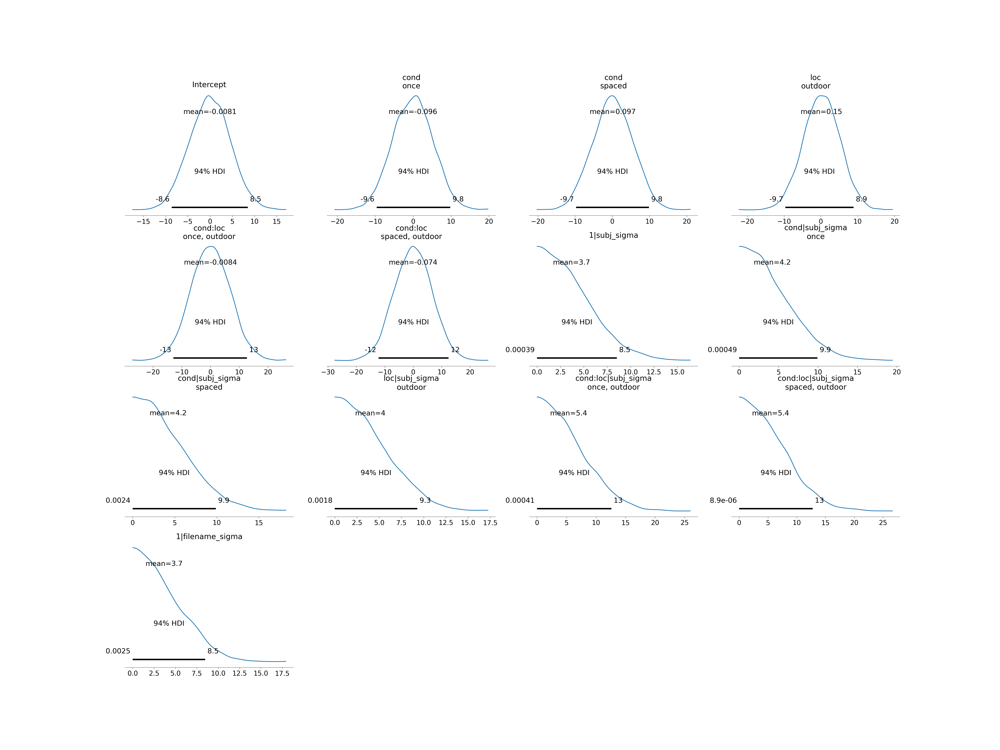

In [15]:
model.plot_priors();

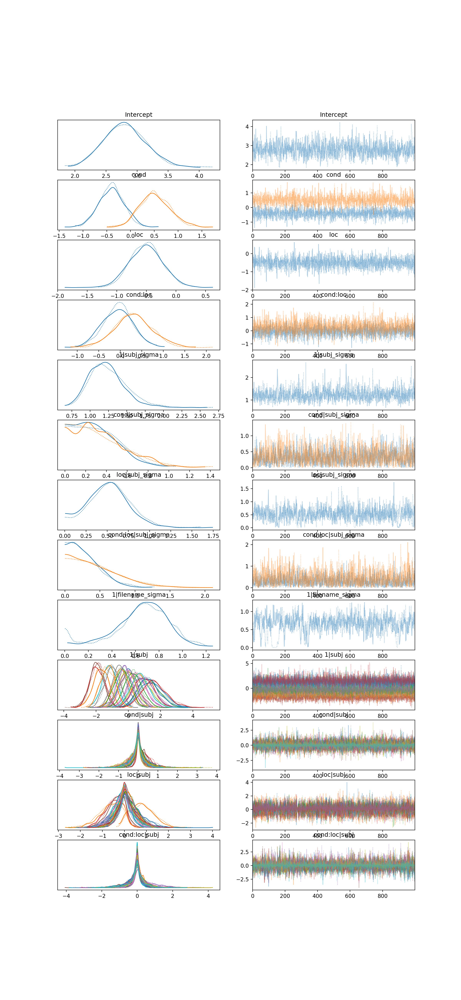

In [16]:
# plot the inference traces for the fit
az.plot_trace(results, 
              var_names=["~1|filename"],
              compact=True);

In [17]:
az.summary(results,var_names=["~1|filename"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,2.805,0.349,2.134,3.420,0.012,0.008,883.0,1113.0,1.00
cond[once],-0.399,0.274,-0.938,0.087,0.006,0.005,2403.0,1538.0,1.01
cond[spaced],0.517,0.335,-0.099,1.163,0.008,0.006,1944.0,1354.0,1.00
loc[outdoor],-0.501,0.282,-1.007,0.034,0.006,0.005,1881.0,1357.0,1.00
"cond:loc[once, outdoor]",-0.057,0.350,-0.735,0.585,0.007,0.007,2394.0,1504.0,1.01
...,...,...,...,...,...,...,...,...,...
"cond:loc|subj[spaced, outdoor, s020]",0.074,0.570,-1.049,1.248,0.011,0.012,3518.0,1506.0,1.00
"cond:loc|subj[spaced, outdoor, s021]",0.214,0.514,-0.621,1.286,0.011,0.010,2711.0,1619.0,1.00
"cond:loc|subj[spaced, outdoor, s022]",0.006,0.475,-0.893,1.067,0.009,0.010,3052.0,1306.0,1.00
"cond:loc|subj[spaced, outdoor, s023]",0.052,0.537,-0.951,1.110,0.010,0.010,2794.0,1509.0,1.00


## Significance involves evaluating the posteriors

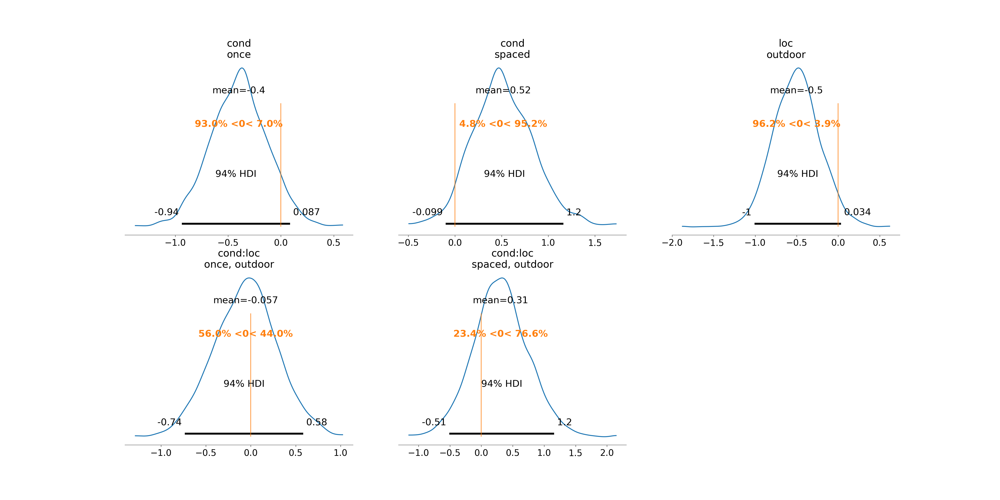

In [18]:
# plot the fixed effect posteriors to examine significance
az.plot_posterior(results, ref_val=0.0, 
                  var_names=['cond', 'loc', 'cond:loc']);

## Testing hypotheses

- You can test as many hypotheses as you'd like with a fitted model.
- This does not count as multiple comparisons!

In [19]:
# we care about differences in posteriors now
post = results.posterior
post['spaced-once'] = post['cond'].sel(cond_dim='spaced') - \
    post['cond'].sel(cond_dim='once')


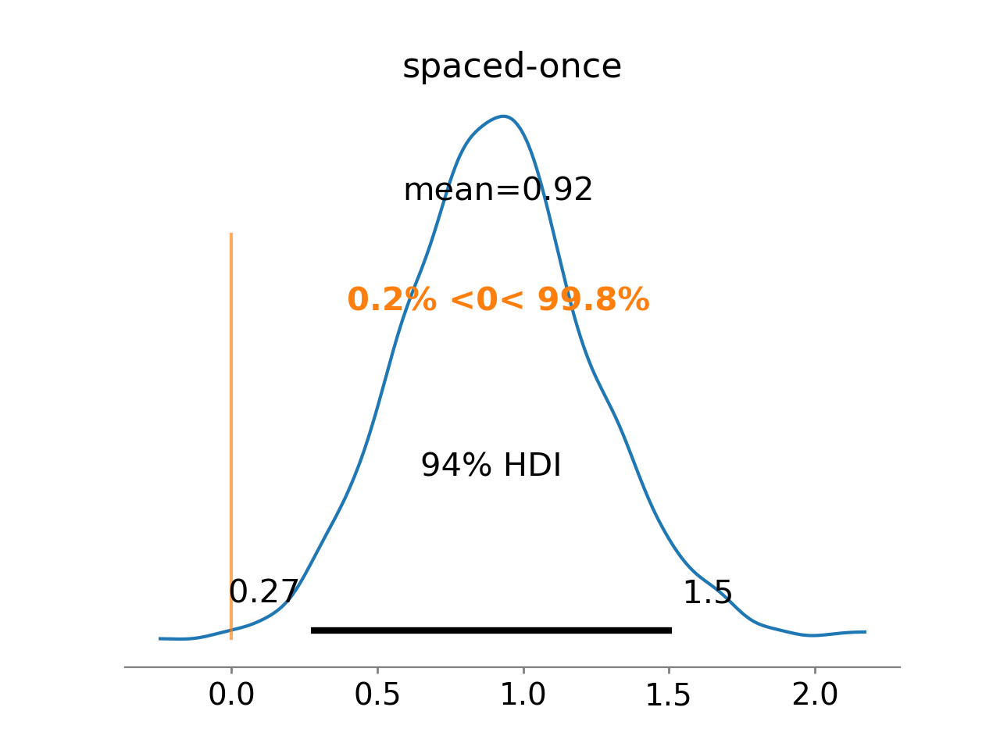

In [20]:
az.plot_posterior(results, ref_val=0.0, 
                  var_names=['spaced-once']);

## What about a model with lag instead of conds?


c:\Users\student\anaconda3\envs\bambi_real\Lib\site-packages\plotnine\stats\stat_bin.py:109: PlotnineWarning: 'stat_bin()' using 'bins = 10'. Pick better value with 'binwidth'.


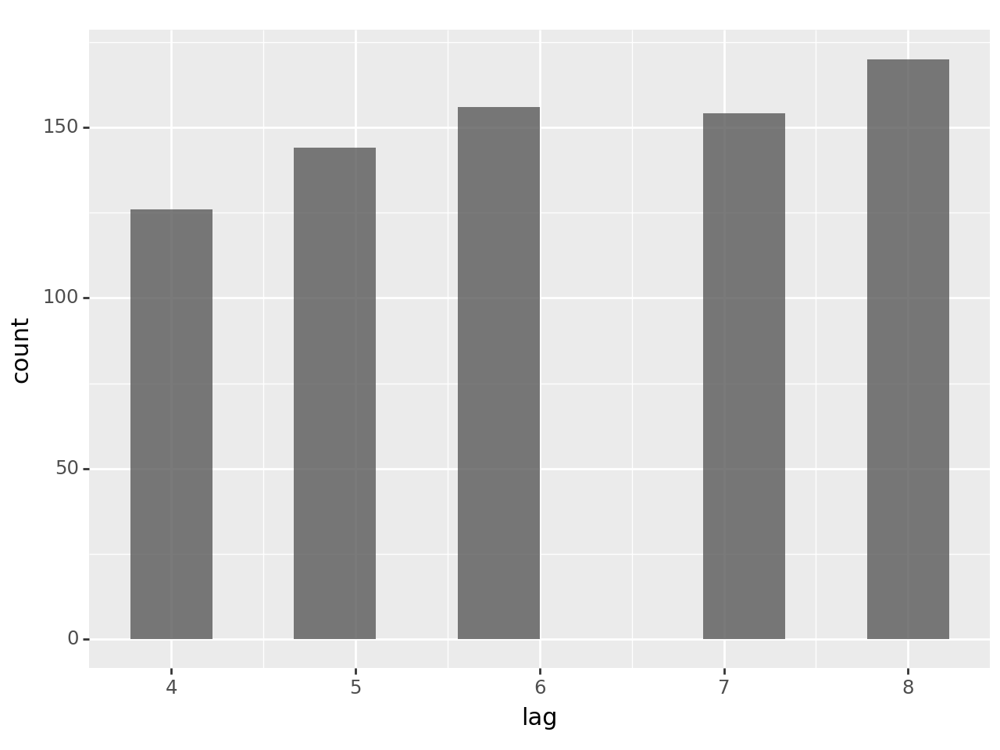

<Figure Size: (640 x 480)>

In [21]:
# Show the distributions of valence values
p = (pn.ggplot(df_t.loc[df_t.cond=='spaced'], 
               pn.aes('lag'))
     + pn.geom_histogram(alpha=.8)
    )
p

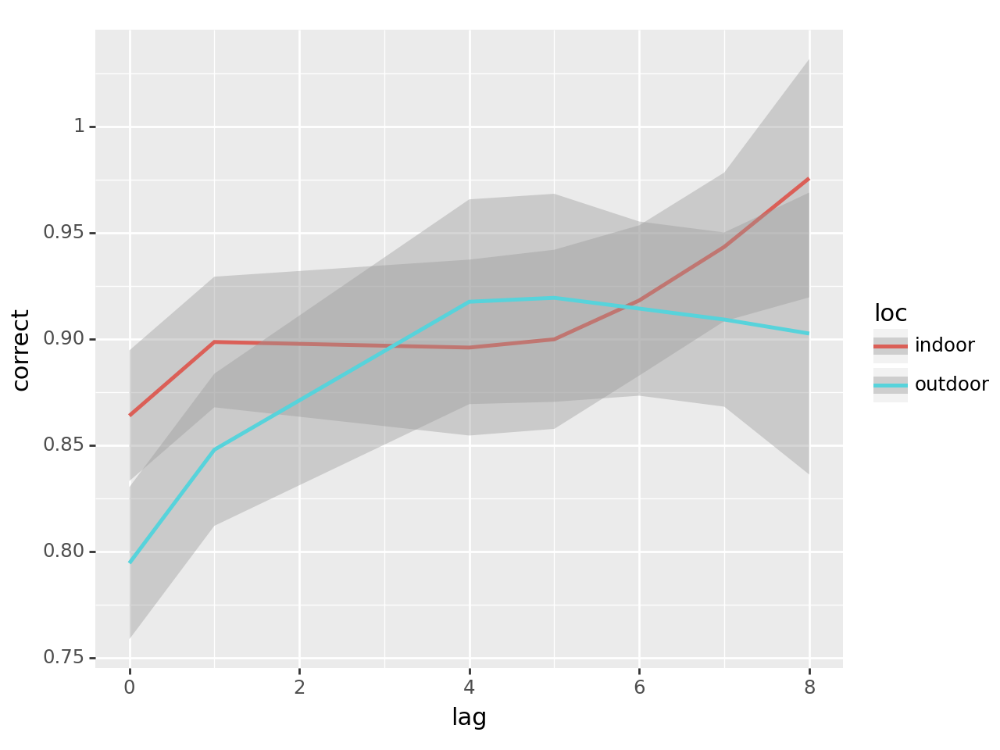

<Figure Size: (640 x 480)>

In [23]:
p = (pn.ggplot(df_t.loc[df_t['type']=='target'], pn.aes('lag', 'correct', color='loc'))
     + pn.geom_smooth(method='loess')
    )
p

In [24]:
# First initialize the model with the data frame we're using
model_lag = bmb.Model('correct ~ lag * loc + (lag*loc|subj)', 
                      df_t.loc[df_t['cond'].isin(['massed', 'spaced'])],
                      family='bernoulli')

# next build the regression with both fixed and random effects
res_lag = model_lag.fit(idata_kwargs=dict(log_likelihood=True))

Modeling the probability that correct==1
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [Intercept, lag, loc, lag:loc, 1|subj_sigma, 1|subj_offset, lag|subj_sigma, lag|subj_offset, loc|subj_sigma, loc|subj_offset, lag:loc|subj_sigma, lag:loc|subj_offset]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 147 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


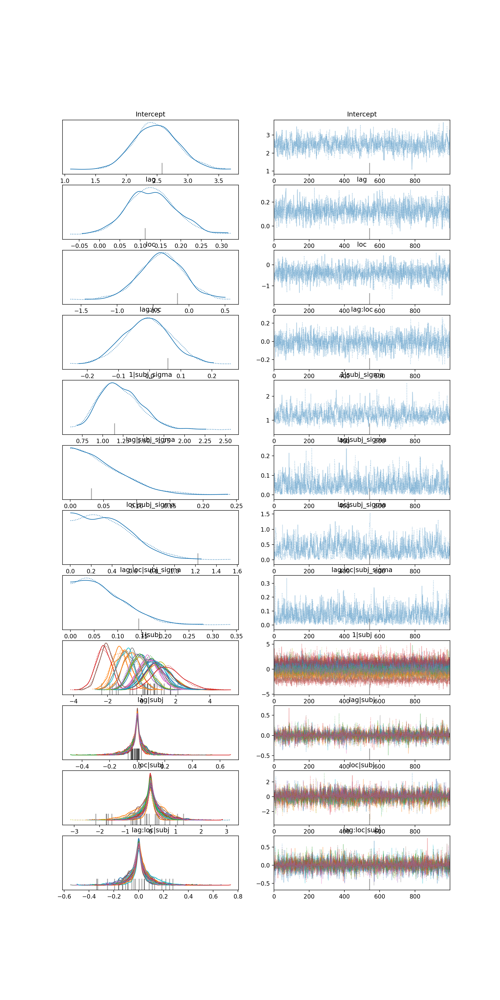

In [25]:
# plot the inference traces for the fit
az.plot_trace(res_lag, 
              compact=True);

In [26]:
az.summary(res_lag)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Intercept,2.479,0.346,1.832,3.131,0.012,0.009,821.0,1074.0,1.0
lag,0.128,0.059,0.019,0.237,0.002,0.001,1398.0,1188.0,1.0
loc[outdoor],-0.383,0.302,-0.948,0.201,0.008,0.006,1561.0,1351.0,1.0
lag:loc[outdoor],-0.007,0.076,-0.150,0.141,0.002,0.002,1323.0,1316.0,1.0
1|subj_sigma,1.218,0.256,0.816,1.724,0.009,0.007,743.0,919.0,1.0
...,...,...,...,...,...,...,...,...,...
"lag:loc|subj[outdoor, s020]",0.018,0.092,-0.152,0.212,0.002,0.002,2048.0,1410.0,1.0
"lag:loc|subj[outdoor, s021]",0.025,0.072,-0.100,0.177,0.002,0.001,2149.0,1503.0,1.0
"lag:loc|subj[outdoor, s022]",0.000,0.072,-0.143,0.143,0.002,0.001,1964.0,1483.0,1.0
"lag:loc|subj[outdoor, s023]",0.010,0.082,-0.150,0.164,0.002,0.002,1778.0,1405.0,1.0


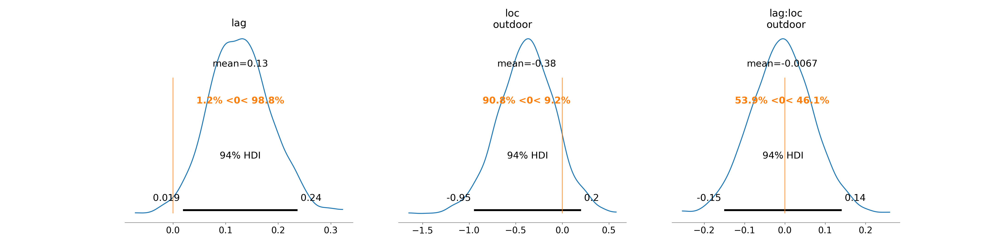

In [27]:
# plot the fixed effect posteriors to examine significance
az.plot_posterior(res_lag, ref_val=0.0, 
                  var_names=['lag', 'loc', 'lag:loc']);

## What about dprime?

- This would involve a within-subj summary stat calculation
- But we can still make a non-hierarchical Bayesian regression

In [28]:
def calc_dprime(n_hits, n_targets, n_false_alarms, n_lures):
    # calculate corrected hit rate and false alarm rate 
    # (to avoid zeros)
    hr_trans = (n_hits+.5)/(n_targets+1)
    far_trans = (n_false_alarms+.5)/(n_lures+1)
    
    # calculate dprime
    Z = dists.norm.ppf
    dprime = Z(hr_trans) - Z(far_trans)
    return dprime

def calc_c(n_hits, n_targets, n_false_alarms, n_lures):
    # calculate corrected hit rate and false alarm rate 
    # (to avoid zeros)
    hr_trans = (n_hits+.5)/(n_targets+1)
    far_trans = (n_false_alarms+.5)/(n_lures+1)
    
    # calculate bias
    Z = dists.norm.ppf
    c = -(Z(hr_trans) + Z(far_trans)) / 2
    return c


In [29]:
# calc target hits
tperf = df_t.loc[df_t.type=='target'].groupby(['subj', 'cond', 'loc'])['old_resp'].agg(['sum', 'count', 'mean'])
tperf = tperf.reset_index()
tperf = tperf.rename(columns={'sum': 'target_sum', 
                              'count': 'target_count',
                              'mean': 'target_mean'})
tperf.head(10)

,subj,cond,loc,target_sum,target_count,target_mean
0,s000,massed,indoor,14,15,0.933333
1,s000,massed,outdoor,15,15,1.000000
2,s000,once,indoor,14,15,0.933333
3,s000,once,outdoor,10,15,0.666667
4,s000,spaced,indoor,14,15,0.933333
5,s000,spaced,outdoor,12,15,0.800000
6,s001,massed,indoor,11,15,0.733333
7,s001,massed,outdoor,14,15,0.933333
8,s001,once,indoor,6,15,0.400000
9,s001,once,outdoor,12,15,0.800000


In [30]:
# calc lure false alarms
lperf = df_t.loc[df_t.type=='lure'].groupby(['subj', 'loc'])['old_resp'].agg(['sum', 'count', 'mean'])
lperf = lperf.reset_index()
lperf = lperf.rename(columns={'sum': 'lure_sum', 
                              'count': 'lure_count',
                              'mean': 'lure_mean'})
lperf.head()


,subj,loc,lure_sum,lure_count,lure_mean
0,s000,indoor,6,45,0.133333
1,s000,outdoor,2,45,0.044444
2,s001,indoor,3,45,0.066667
3,s001,outdoor,6,45,0.133333
4,s002,indoor,0,45,0.000000


In [31]:
# merge the two dataframes
# will repeat info as required
perf = pd.merge(left=tperf, right=lperf)
perf.head()

,subj,cond,loc,target_sum,target_count,target_mean,lure_sum,lure_count,lure_mean
0,s000,massed,indoor,14,15,0.933333,6,45,0.133333
1,s000,once,indoor,14,15,0.933333,6,45,0.133333
2,s000,spaced,indoor,14,15,0.933333,6,45,0.133333
3,s000,massed,outdoor,15,15,1.000000,2,45,0.044444
4,s000,once,outdoor,10,15,0.666667,2,45,0.044444


In [32]:
# add the dprime as a new column (axis=1 tells it to go by row)
perf['dprime'] = perf.apply(lambda x: calc_dprime(x['target_sum'], x['target_count'],
                                                    x['lure_sum'], x['lure_count']),
                                  axis=1)
# add bias (c) as a new column
perf['c'] = perf.apply(lambda x: calc_c(x['target_sum'], x['target_count'],
                                                x['lure_sum'], x['lure_count']),
                                  axis=1)
perf.head()

,subj,cond,loc,target_sum,target_count,target_mean,lure_sum,lure_count,lure_mean,dprime,c
0,s000,massed,indoor,14,15,0.933333,6,45,0.133333,2.392488,-0.121767
1,s000,once,indoor,14,15,0.933333,6,45,0.133333,2.392488,-0.121767
2,s000,spaced,indoor,14,15,0.933333,6,45,0.133333,2.392488,-0.121767
3,s000,massed,outdoor,15,15,1.000000,2,45,0.044444,3.466815,-0.129324
4,s000,once,outdoor,10,15,0.666667,2,45,0.044444,2.006334,0.600917


## Plot dprime as a function of cond and loc

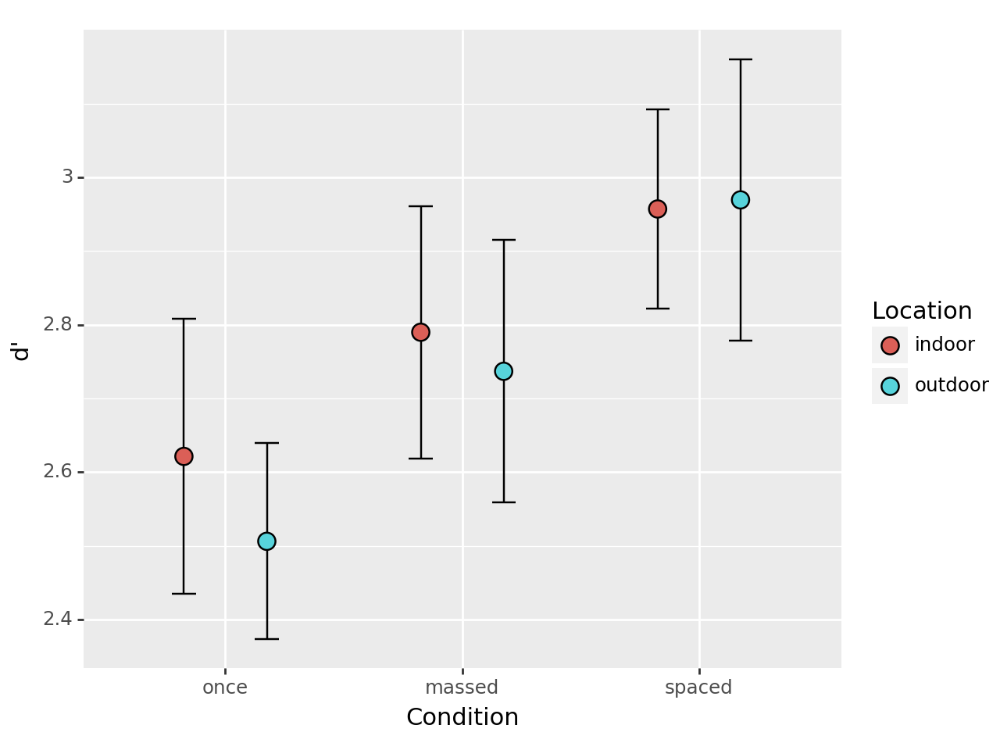

<Figure Size: (640 x 480)>

In [45]:
# use ci_within and plotnine to make the plot
res_dprime = ci_within(perf, #.loc[df_t.type=='target'],  
                indexvar='subj',       # column that identifies a subject
                withinvars=['cond', 'loc'],     # list of columns for grouping within subject
                measvar='dprime')        # dependent variable averaging over
res_dprime = res_dprime.reset_index()


p = (pn.ggplot(res_dprime, pn.aes(x='cond', y='mean', fill='loc'))
     + pn.geom_errorbar(pn.aes(ymin='mean-ci', ymax='mean+ci', width=0.2), 
                        position=pn.position_dodge(.7))
     + pn.geom_point(position=pn.position_dodge(.7), size=4)
     #+ pn.facet_wrap('~type')
     + pn.scale_x_discrete(limits=['once', 'massed', 'spaced'])
     + pn.labs(x="Condition", y = "d'", fill='Location')
    )
p

## Plot c as a function of cond and loc

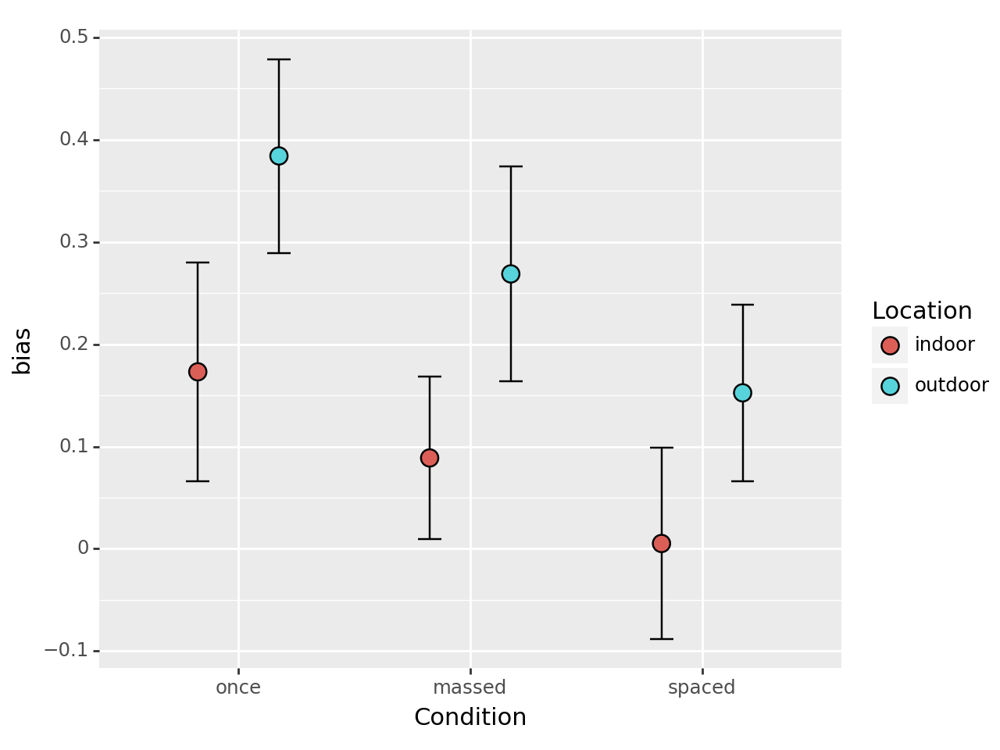

<Figure Size: (640 x 480)>

In [46]:
# use ci_within and plotnine to make the plot
res_c = ci_within(perf, #.loc[df_t.type=='target'],  
                indexvar='subj',       # column that identifies a subject
                withinvars=['cond', 'loc'],     # list of columns for grouping within subject
                measvar='c')        # dependent variable averaging over
res_c = res_c.reset_index()


p = (pn.ggplot(res_c, pn.aes(x='cond', y='mean', fill='loc'))
     + pn.geom_errorbar(pn.aes(ymin='mean-ci', ymax='mean+ci', width=0.2), 
                        position=pn.position_dodge(.7))
     + pn.geom_point(position=pn.position_dodge(.7), size=4)
     #+ pn.facet_wrap('~type')
     + pn.scale_x_discrete(limits=['once', 'massed', 'spaced'])
     + pn.labs(x="Condition", y = "bias", fill='Location')
    )
p

## Bayesian regression of dprime 

In [47]:
# next build the regression with only cond
res_dprime = bmb.Model('dprime ~ cond * loc', 
                       perf).fit(idata_kwargs=dict(log_likelihood=True))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [dprime_sigma, Intercept, cond, loc, cond:loc]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 27 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


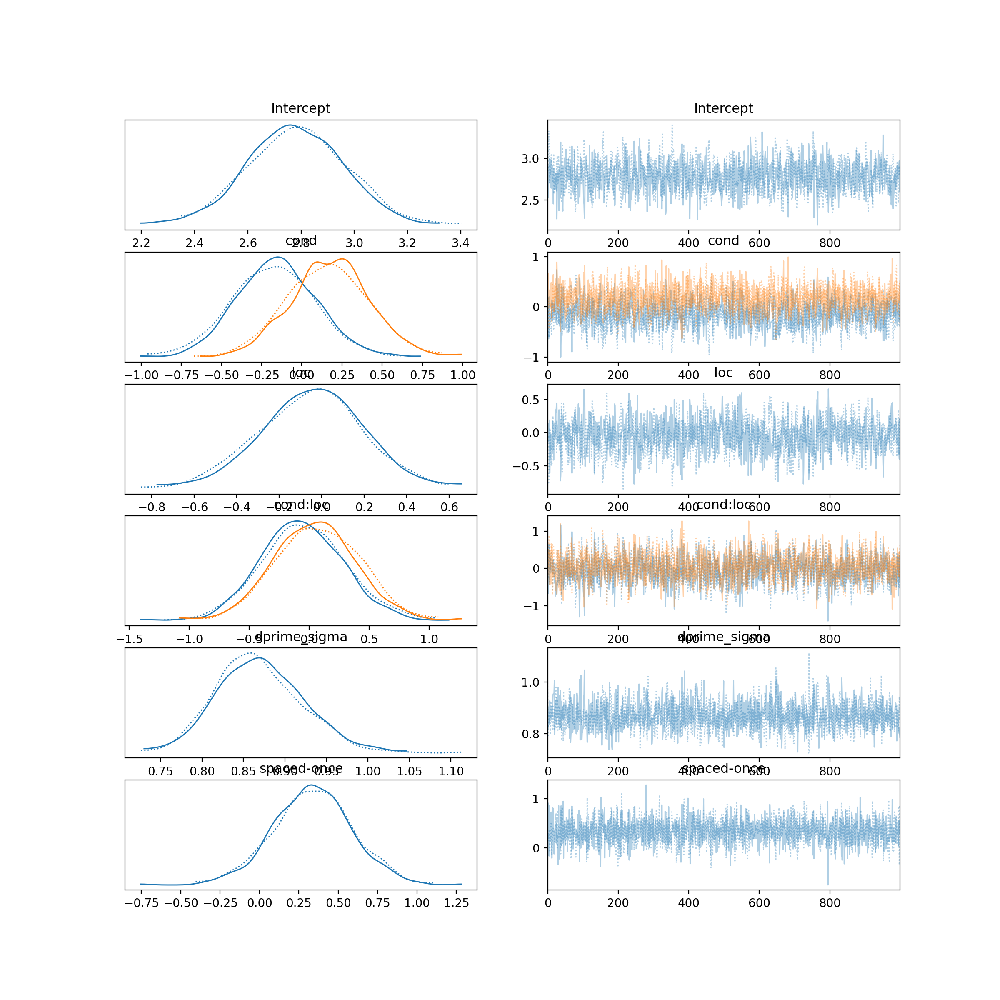

In [53]:
# plot the inference traces for the fit
az.plot_trace(res_dprime, 
              compact=True);

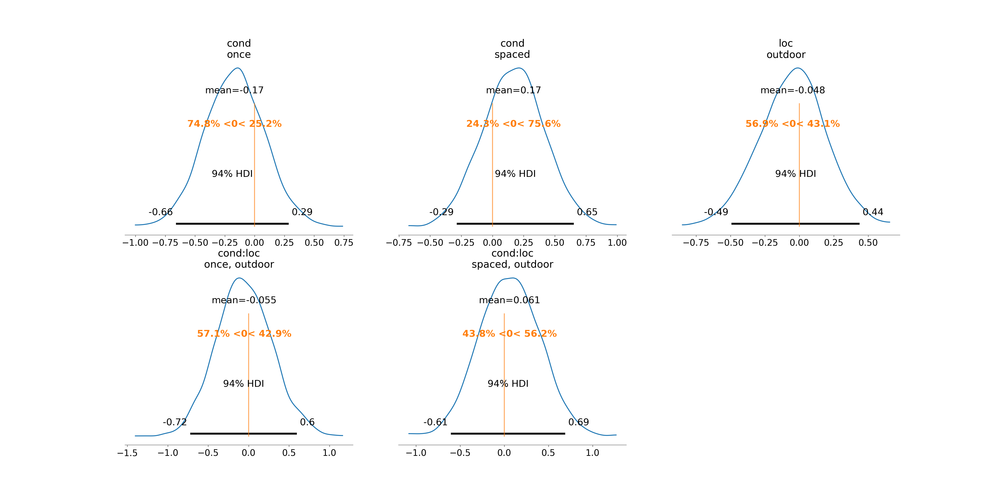

In [49]:
# plot the fixed effect posteriors to examine significance
az.plot_posterior(res_dprime, ref_val=0.0, 
                  var_names=['cond', 'loc', 'cond:loc']);

In [50]:
# take difference of once and spaced posteriors
post = res_dprime.posterior
post['spaced-once'] = post['cond'].sel(cond_dim='spaced') - \
    post['cond'].sel(cond_dim='once')

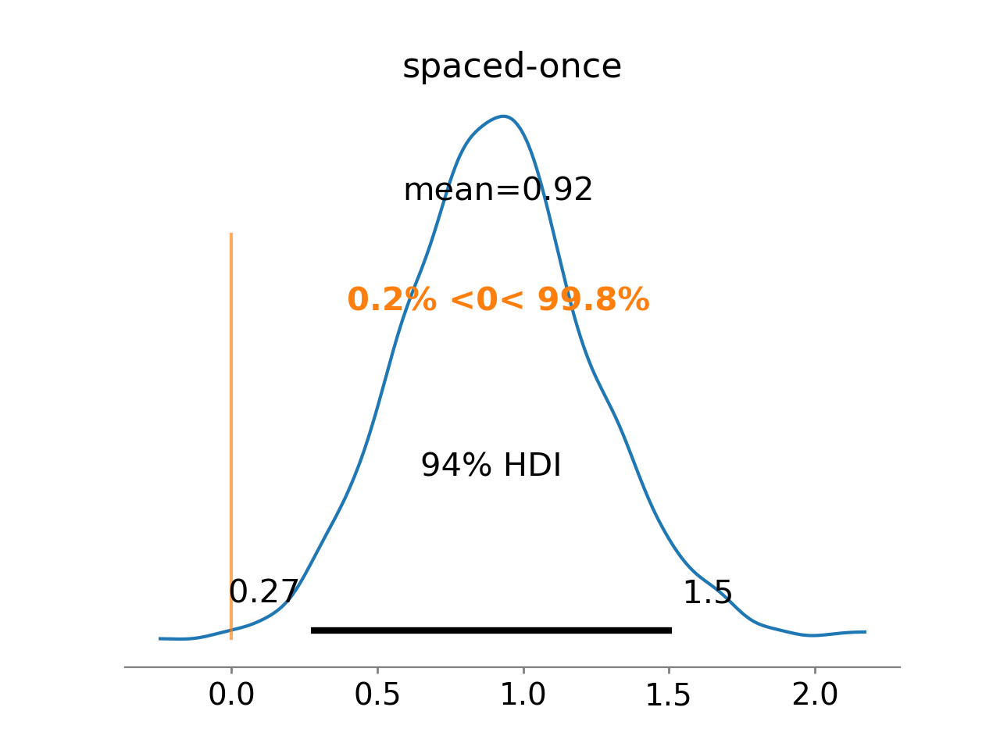

In [51]:
# use plot_posterior to plot that difference
az.plot_posterior(results, ref_val=0.0, 
                  var_names=['spaced-once']);

## Summarize results

Add bullet points below to summarize what you found with the dprime and c plots and models.

- Plots
    - dprime
        - The participants have higher sensitivity for old vs new items in the spaced condition as opposed to the once presented condition becuase the error bars do not overlap. 
        - There is not a significant difference between massed and once, and massed and spaced conditions, as the error bars do overlap.
        - There is no difference between the location for any of the conditions.
    - bias
        - In general there seems to be less bias in the indoor vs outdoor locations. This is significant in the once presented condition.
        - Aside from differences in location, there doesn't seem to be a significant difference in bias between any conditions. However, I'm sure a trend line would appear if you did a regression not a comparison.
        - Overall (except indoor spaced) people have a bias towards saying old as compared to saying new. 
- dprime model
    - overall the model looks to be fit well as the trace plots look like fuzzy catepillars
    - none of the main effects are significantly different from zero
    - a comparison of the spaced and once presented posteriors shows us that there is a 99.8% change that the spaced condition predicts a higher dprime.

# Assignments for this week

- Finish this analysis of the spacing data and submit it online.
